# Stream A — Bus Patronage, GTFS and Bike-Network Proximity Analysis

**Project:** Urban Streetscape Intervention Analysis  
**Team:** Group 4, Stream A  
**Author:** Passion Nguyen  
**Environment:** Google Colab

## Purpose

This exploratory data analysis establishes a baseline view of Victoria's bus system and examines where scheduled bus stops are located near bicycle infrastructure.

The notebook combines three complementary datasets:

- **Monthly public-transport patronage** to examine changes in average daily MetroBus and RegionalBus use over time.
- **Victorian GTFS Schedule data** to examine scheduled routes, trips and stops.
- **Bicycle infrastructure GeoJSON** to identify bus stops within a defined distance of bike-network segments.

This is a descriptive baseline analysis. It does not estimate the causal effect of opening a specific bike lane because confirmed intervention dates and local route- or stop-level passenger observations are not yet available.

## How to run

Run the notebook from top to bottom in Google Colab. When prompted, upload the monthly patronage CSV, Victorian GTFS ZIP archive and bicycle-network GeoJSON. The source datasets are not stored in this notebook.


## 1. Environment setup

Install and import the packages used for data processing, spatial analysis, charts, ZIP extraction and interactive maps.


In [ ]:
%pip install -q geopandas pyogrio folium

import os
import zipfile
from io import BytesIO

import folium
import geopandas as gpd
import matplotlib.pyplot as plt
import pandas as pd
from folium.plugins import HeatMap
from google.colab import files

plt.style.use("seaborn-v0_8-whitegrid")


## 2. Load the monthly patronage dataset

First, upload the monthly patronage CSV in Google Colab. This dataset is aggregated by mode, month and day type, so it is suitable for statewide trend analysis but not for measuring passenger numbers at an individual stop.

In [ ]:

uploaded_patronage = files.upload()
patronage_file = next(iter(uploaded_patronage))
patronage = pd.read_csv(patronage_file)

print("Dataset shape:", patronage.shape)
display(patronage.head())

Saving monthly_average_patronage_by_day_type_and_by_mode.csv to monthly_average_patronage_by_day_type_and_by_mode.csv
Dataset shape: (4450, 7)


,Year,Month,Month_name,Day_of_week,Day_type,Mode,Pax_daily
0,2018,1,Jan,Friday,School Holiday Weekday,MetroBus,268350
1,2018,1,Jan,Friday,School Holiday Weekday,MetroTrain,570700
2,2018,1,Jan,Friday,School Holiday Weekday,RegionalBus,21550
3,2018,1,Jan,Friday,School Holiday Weekday,RegionalTrain,43700
4,2018,1,Jan,Friday,School Holiday Weekday,Tram,529250


### Inspect the patronage structure

This check confirms the available columns, data types and basic quality of the source file before filtering it for bus modes.

In [ ]:
patronage.info()
display(patronage.columns.to_frame("column_name"))
display(patronage.isna().sum().to_frame("missing_values"))

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4450 entries, 0 to 4449
Data columns (total 7 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   Year         4450 non-null   int64 
 1   Month        4450 non-null   int64 
 2   Month_name   4450 non-null   object
 3   Day_of_week  4450 non-null   object
 4   Day_type     4450 non-null   object
 5   Mode         4450 non-null   object
 6   Pax_daily    4450 non-null   int64 
dtypes: int64(3), object(4)
memory usage: 243.5+ KB


,0
Year,Year
Month,Month
Month_name,Month_name
Day_of_week,Day_of_week
Day_type,Day_type
Mode,Mode
Pax_daily,Pax_daily


,missing_values
Year,0
Month,0
Month_name,0
Day_of_week,0
Day_type,0
Mode,0
Pax_daily,0


## 3. Prepare the bus patronage data

The analysis focuses on `MetroBus` and `RegionalBus`. A date column is created so the monthly observations can be plotted in time order.

In [ ]:
bus_patronage = patronage[
    patronage["Mode"].isin(["MetroBus", "RegionalBus"])
].copy()

bus_patronage["date"] = pd.to_datetime(
    bus_patronage[["Year", "Month"]].assign(DAY=1)
)

print("Bus records:", len(bus_patronage))
display(bus_patronage.head())

Bus records: 1780


,Year,Month,Month_name,Day_of_week,Day_type,Mode,Pax_daily,date
0,2018,1,Jan,Friday,School Holiday Weekday,MetroBus,268350,2018-01-01
2,2018,1,Jan,Friday,School Holiday Weekday,RegionalBus,21550,2018-01-01
5,2018,1,Jan,Monday,Normal Weekday,MetroBus,308450,2018-01-01
7,2018,1,Jan,Monday,Normal Weekday,RegionalBus,22600,2018-01-01
10,2018,1,Jan,Monday,School Holiday Weekday,MetroBus,298500,2018-01-01


## 4. Monthly bus patronage trend

This line chart shows the main time pattern. It helps identify the 2020–2021 COVID-era disruption, later recovery and the difference in scale between MetroBus and RegionalBus.

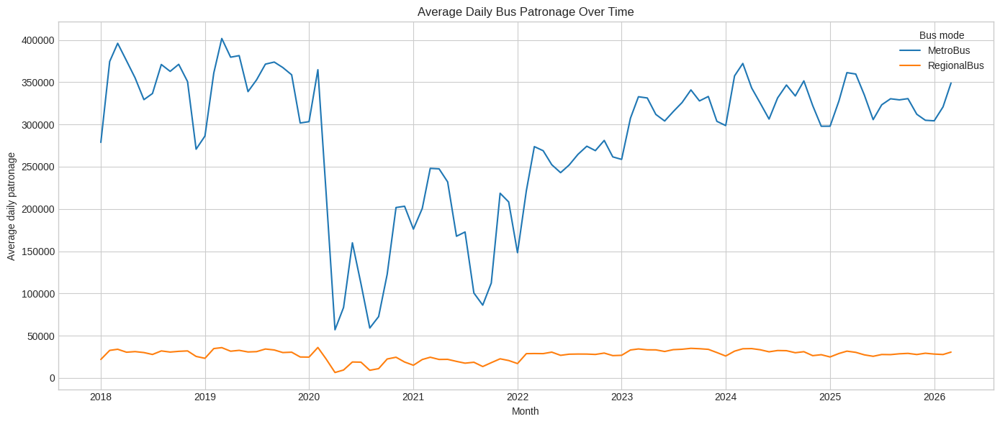

In [ ]:
monthly_bus = (
    bus_patronage
    .groupby(["date", "Mode"], as_index=False)["Pax_daily"]
    .mean()
)

plt.figure(figsize=(14, 6))
for mode, data in monthly_bus.groupby("Mode"):
    plt.plot(data["date"], data["Pax_daily"], label=mode)

plt.title("Average Daily Bus Patronage Over Time")
plt.xlabel("Month")
plt.ylabel("Average daily patronage")
plt.legend(title="Bus mode")
plt.tight_layout()
plt.show()

**Interpretation:** Bus use changes substantially over time, with a pronounced fall during the COVID period. MetroBus values are much higher than RegionalBus values, so the two modes should be interpreted separately rather than combined into one total without explanation. The 2026 records should be treated as year-to-date rather than a complete-year result.

## 5. Patronage by day type

This comparison adds a passenger-behaviour perspective. Weekday, weekend and public-holiday averages can reveal when bus demand is strongest, although the aggregated data cannot explain the behaviour of a particular route or stop.

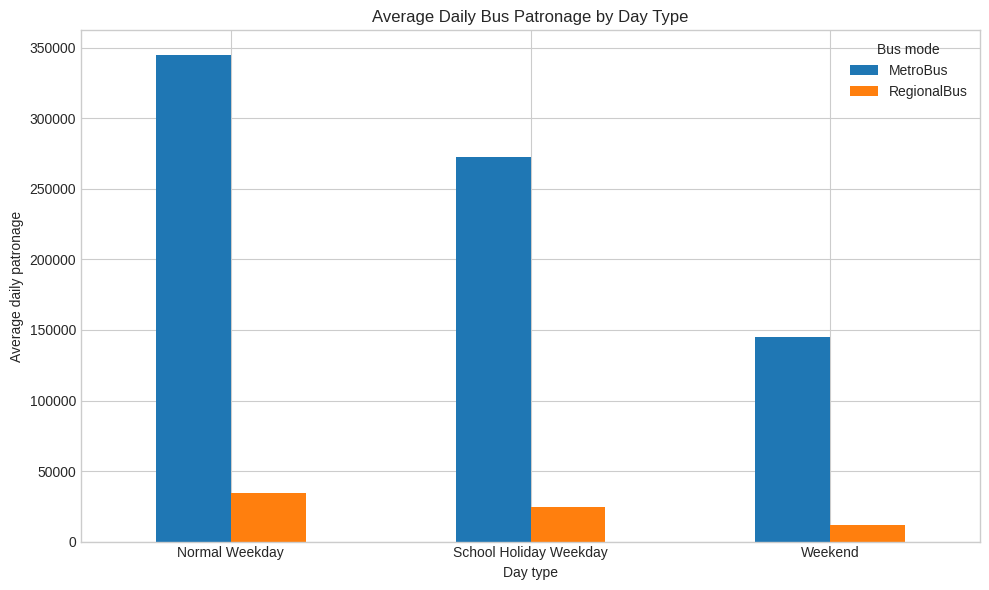

In [ ]:
day_type_summary = (
    bus_patronage
    .groupby(["Mode", "Day_type"], as_index=False)["Pax_daily"]
    .mean()
)

day_type_pivot = day_type_summary.pivot(
    index="Day_type", columns="Mode", values="Pax_daily"
)

day_type_pivot.plot(kind="bar", figsize=(10, 6))
plt.title("Average Daily Bus Patronage by Day Type")
plt.xlabel("Day type")
plt.ylabel("Average daily patronage")
plt.xticks(rotation=0)
plt.legend(title="Bus mode")
plt.tight_layout()
plt.show()

**Interpretation:** Higher normal-weekday patronage may reflect commuting, school and other regular weekday travel. Lower weekend or public-holiday patronage does not necessarily mean the service is unimportant; it may reflect different travel patterns and service schedules.

## 6. Pre-COVID, COVID and post-COVID comparison

The period comparison makes the structural break easier to describe. It should not be interpreted as evidence that a transport intervention caused the change, because many external factors affected travel during these years.

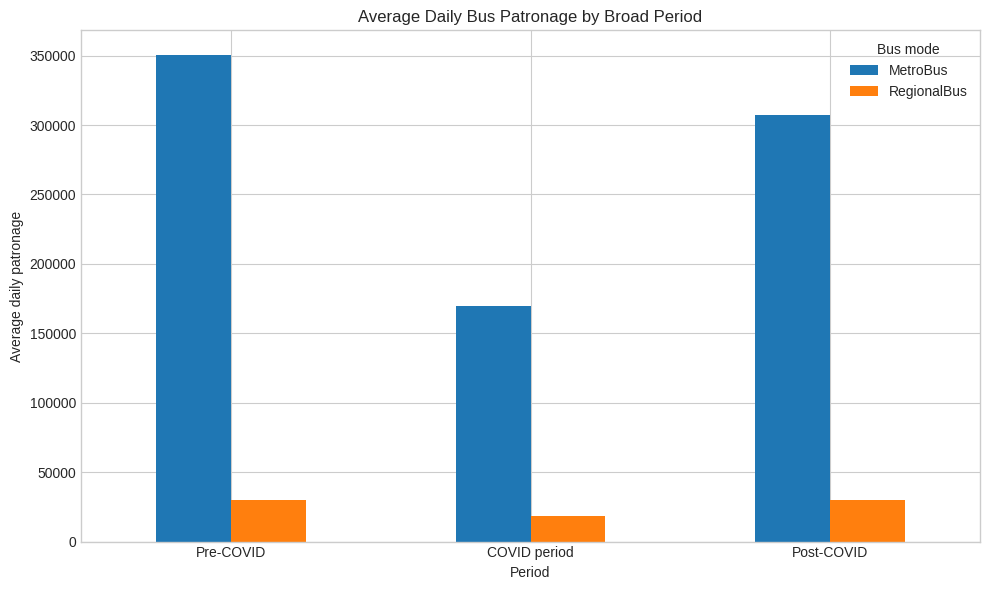

In [ ]:
bus_patronage["Period"] = bus_patronage["Year"].apply(
    lambda year: (
        "Pre-COVID" if year <= 2019
        else "COVID period" if year in [2020, 2021]
        else "Post-COVID"
    )
)

period_summary = (
    bus_patronage
    .groupby(["Mode", "Period"], as_index=False)["Pax_daily"]
    .mean()
)

period_pivot = period_summary.pivot(
    index="Period", columns="Mode", values="Pax_daily"
).reindex(["Pre-COVID", "COVID period", "Post-COVID"])

period_pivot.plot(kind="bar", figsize=(10, 6))
plt.title("Average Daily Bus Patronage by Broad Period")
plt.xlabel("Period")
plt.ylabel("Average daily patronage")
plt.xticks(rotation=0)
plt.legend(title="Bus mode")
plt.tight_layout()
plt.show()

## 7. Load the GTFS Schedule data

GTFS provides the scheduled network structure rather than passenger counts. The downloaded Victorian GTFS file contains nested ZIP files, so the next cells extract those files and read the tables needed for bus analysis.

In [ ]:
uploaded_gtfs = files.upload()
outer_zip = next(iter(uploaded_gtfs))

gtfs_dir = "/content/gtfs_data"
os.makedirs(gtfs_dir, exist_ok=True)

with zipfile.ZipFile(outer_zip, "r") as archive:
    archive.extractall(gtfs_dir)

nested_zips = []
for root, _, filenames in os.walk(gtfs_dir):
    nested_zips.extend(
        os.path.join(root, filename)
        for filename in filenames
        if filename.endswith(".zip")
    )

print("Nested GTFS files found:", len(nested_zips))

Saving gtfs.zip to gtfs.zip
Nested GTFS files found: 8


In [ ]:
gtfs_tables = {
    "routes.txt": [],
    "trips.txt": [],
    "stops.txt": [],
    "stop_times.txt": []
}

for nested_zip in nested_zips:
    with zipfile.ZipFile(nested_zip, "r") as archive:
        for filename in gtfs_tables:
            if filename in archive.namelist():
                table = pd.read_csv(
                    BytesIO(archive.read(filename)),
                    low_memory=False
                )
                table["source_file"] = os.path.basename(nested_zip)
                gtfs_tables[filename].append(table)

routes = pd.concat(gtfs_tables["routes.txt"], ignore_index=True)
trips = pd.concat(gtfs_tables["trips.txt"], ignore_index=True)
stops = pd.concat(gtfs_tables["stops.txt"], ignore_index=True)
stop_times = pd.concat(gtfs_tables["stop_times.txt"], ignore_index=True)

print("Routes:", routes.shape)
print("Trips:", trips.shape)
print("Stops:", stops.shape)
print("Stop-time records:", stop_times.shape)

Routes: (1072, 8)
Trips: (314476, 10)
Stops: (31981, 12)
Stop-time records: (11998317, 10)


## 8. Filter the GTFS data to bus services

The route type is converted to numeric values before filtering. Standard GTFS uses route type `3` for buses; this source also contains extended bus codes in the `700–799` range.

In [ ]:
routes["route_type"] = pd.to_numeric(routes["route_type"], errors="coerce")

bus_routes = routes[
    (routes["route_type"] == 3)
    | routes["route_type"].between(700, 799)
].copy()

bus_trips = trips[trips["route_id"].isin(bus_routes["route_id"])].copy()
bus_stop_times = stop_times[
    stop_times["trip_id"].isin(bus_trips["trip_id"])
].copy()
bus_stops = stops[stops["stop_id"].isin(bus_stop_times["stop_id"])].copy()

print("Bus routes:", bus_routes["route_id"].nunique())
print("Scheduled bus trips:", bus_trips["trip_id"].nunique())
print("Bus stops:", bus_stops["stop_id"].nunique())
print("Bus stop-time records:", len(bus_stop_times))

Bus routes: 948
Scheduled bus trips: 172456
Bus stops: 25796
Bus stop-time records: 7026120


## 9. GTFS data-quality checks

These checks test missing values, logical duplicates and stop-coordinate validity. Optional fields may legitimately contain missing values, so missing values are reported rather than automatically deleting records.

In [ ]:
quality_report = pd.DataFrame({
    "table": ["Bus routes", "Bus trips", "Bus stops", "Bus stop-times"],
    "rows": [len(bus_routes), len(bus_trips), len(bus_stops), len(bus_stop_times)],
    "exact_duplicate_rows": [
        bus_routes.duplicated().sum(),
        bus_trips.duplicated().sum(),
        bus_stops.duplicated().sum(),
        bus_stop_times.duplicated().sum()
    ],
    "total_missing_values": [
        bus_routes.isna().sum().sum(),
        bus_trips.isna().sum().sum(),
        bus_stops.isna().sum().sum(),
        bus_stop_times.isna().sum().sum()
    ]
})

display(quality_report)

print("Duplicate route IDs:", bus_routes["route_id"].duplicated().sum())
print("Duplicate trip IDs:", bus_trips["trip_id"].duplicated().sum())
print("Duplicate stop IDs:", bus_stops["stop_id"].duplicated().sum())
print(
    "Duplicate trip-stop records:",
    bus_stop_times.duplicated(
        subset=["trip_id", "stop_id", "stop_sequence"]
    ).sum()
)

,table,rows,exact_duplicate_rows,total_missing_values
0,Bus routes,948,0,1043
1,Bus trips,172456,0,344912
2,Bus stops,26270,431,79062
3,Bus stop-times,7026120,0,7026120


Duplicate route IDs: 0
Duplicate trip IDs: 0
Duplicate stop IDs: 474
Duplicate trip-stop records: 0


In [ ]:
missing_stop_time_columns = bus_stop_times.isna().sum()
display(
    missing_stop_time_columns[missing_stop_time_columns > 0]
    .to_frame("missing_values")
)

print(
    "Invalid latitude:",
    ((bus_stops["stop_lat"] < -90) | (bus_stops["stop_lat"] > 90)).sum()
)
print(
    "Invalid longitude:",
    ((bus_stops["stop_lon"] < -180) | (bus_stops["stop_lon"] > 180)).sum()
)
print(
    "Missing coordinates:",
    bus_stops[["stop_lat", "stop_lon"]].isna().any(axis=1).sum()
)

,missing_values
stop_headsign,7026120


Invalid latitude: 0
Invalid longitude: 0
Missing coordinates: 0


## 10. Route coverage: stops served by each route

This chart provides a network-structure perspective. Routes with more unique stops may cover longer or more complex corridors, but the number of stops alone does not measure passenger demand or service quality.

,route_id,number_of_stops,route_short_name,route_long_name
0,18-901-aus-1,444,901,Frankston - Melbourne Airport
1,33-901-aus-1,444,901,Frankston - Melbourne Airport
2,17-903-aus-1,440,903,Mordialloc - Altona
3,35-903-aus-1,440,903,Mordialloc - Altona
4,18-903-aus-1,440,903,Mordialloc - Altona
5,18-902-aus-1,367,902,Chelsea Railway Station - Airport West SC
6,33-902-aus-1,367,902,Chelsea Railway Station - Airport West SC
7,41-811-aus-1,262,811,Brighton - Dandenong
8,27-788-aus-1,259,788,Portsea - Frankston Station
9,41-812-aus-1,249,812,Brighton - Dandenong


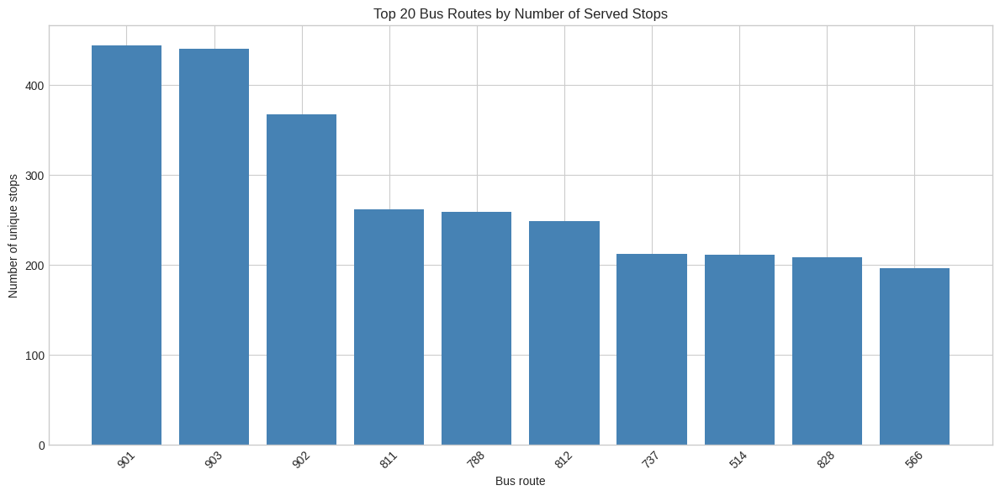

In [ ]:
route_stop_data = bus_stop_times.merge(
    bus_trips[["trip_id", "route_id"]],
    on="trip_id",
    how="left"
)

route_labels = bus_routes[
    ["route_id", "route_short_name", "route_long_name"]
].drop_duplicates("route_id")

stops_per_route = (
    route_stop_data
    .groupby("route_id")["stop_id"]
    .nunique()
    .sort_values(ascending=False)
    .head(20)
    .rename("number_of_stops")
    .reset_index()
    .merge(route_labels, on="route_id", how="left")
)

display(stops_per_route)

plt.figure(figsize=(12, 6))
plt.bar(
    stops_per_route["route_short_name"].fillna(stops_per_route["route_id"]).astype(str),
    stops_per_route["number_of_stops"],
    color="steelblue"
)
plt.title("Top 20 Bus Routes by Number of Served Stops")
plt.xlabel("Bus route")
plt.ylabel("Number of unique stops")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

## 11. Scheduled service by route

This chart compares the number of scheduled trips associated with each route. It describes planned service supply, not actual vehicle operation, punctuality or passenger load.

,route_id,scheduled_trips,service_patterns,route_short_name,route_long_name
40,17-246-aus-1,2456,16,246,Elsternwick - Clifton Hill
32,14-907-aus-1,2105,16,907,Mitcham - City (King/Lonsdale Sts)
266,35-216-aus-1,1990,14,216,Sunshine Station - City (Queen St)
267,35-220-aus-1,1982,14,220,Sunshine Station - City (Queen St)
30,14-905-aus-1,1791,16,905,The Pines SC - City (King/Lonsdale Sts)
268,35-223-aus-1,1710,14,223,Yarraville - Highpoint SC
31,14-906-aus-1,1656,16,906,Warrandyte - City (King/Lonsdale Sts)
33,14-908-aus-1,1634,16,908,The Pines SC - City (King/Lonsdale Sts)
37,17-235-aus-1,1608,16,235,Fishermans Bend - City (Southern Cross Station)
123,21-732-aus-1,1562,8,732,Upper Ferntree Gully - Box Hill Station


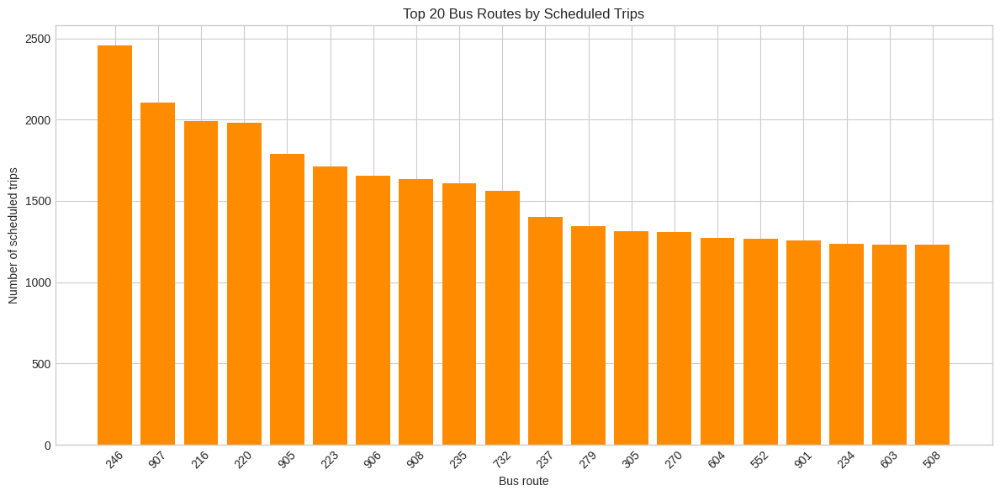

In [ ]:
service_summary = (
    bus_trips
    .groupby("route_id")
    .agg(
        scheduled_trips=("trip_id", "nunique"),
        service_patterns=("service_id", "nunique")
    )
    .reset_index()
    .merge(route_labels, on="route_id", how="left")
    .sort_values("scheduled_trips", ascending=False)
)

top_service = service_summary.head(20)
display(top_service)

plt.figure(figsize=(12, 6))
plt.bar(
    top_service["route_short_name"].fillna(top_service["route_id"]).astype(str),
    top_service["scheduled_trips"],
    color="darkorange"
)
plt.title("Top 20 Bus Routes by Scheduled Trips")
plt.xlabel("Bus route")
plt.ylabel("Number of scheduled trips")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

## 12. Geographic bus-stop coverage

The interactive map shows where bus stops are located. A sample of up to 3,000 stops is used for the marker map so that Google Colab remains responsive; the heatmap uses all valid coordinates.

In [ ]:
map_stops = bus_stops.dropna(subset=["stop_lat", "stop_lon"]).copy()
centre_lat = map_stops["stop_lat"].mean()
centre_lon = map_stops["stop_lon"].mean()

bus_map = folium.Map(
    location=[centre_lat, centre_lon],
    zoom_start=10,
    tiles="CartoDB positron"
)

plot_stops = map_stops.sample(
    min(3000, len(map_stops)),
    random_state=42
)

for _, row in plot_stops.iterrows():
    folium.CircleMarker(
        location=[row["stop_lat"], row["stop_lon"]],
        radius=2,
        color="blue",
        fill=True,
        fill_color="blue",
        fill_opacity=0.6,
        popup=f"{row.get('stop_name', 'Unknown stop')}<br>ID: {row['stop_id']}"
    ).add_to(bus_map)

bus_map

In [ ]:
heat_map = folium.Map(
    location=[centre_lat, centre_lon],
    zoom_start=10,
    tiles="CartoDB positron"
)

HeatMap(
    map_stops[["stop_lat", "stop_lon"]].values.tolist(),
    radius=8,
    blur=12,
    min_opacity=0.4
).add_to(heat_map)

heat_map

## 13. Combined interpretation and limitations

The two datasets answer different questions:

- **Monthly patronage:** How did overall bus usage change over time and across day types?
- **GTFS Schedule:** Where are scheduled bus routes and stops located, and how much planned service is listed?

Together, they provide a useful baseline for understanding the bus system. However, they cannot yet measure what would happen if a bike lane were opened at a specific location. The patronage data is aggregated by mode and month, while GTFS describes scheduled services rather than observed passenger counts. A later before-and-after intervention analysis will require confirmed intervention locations and dates, suitable control areas, and preferably local stop- or route-level observations.

In [ ]:
print(bus_stops.shape)
bus_stops.head()

(26270, 12)


,stop_id,stop_code,stop_name,stop_lat,stop_lon,stop_url,location_type,parent_station,wheelchair_boarding,level_id,platform_code,source_file
0,1000,1000.0,Dole Ave/Cheddar Rd,-37.700775,145.018951,https://transport.vic.gov.au/stop/10056/?utm_s...,NaN,NaN,0.0,Level 0,NaN,google_transit.zip
1,10001,10001.0,Rex St/Taylors Rd,-37.726975,144.776152,https://transport.vic.gov.au/stop/10095/?utm_s...,NaN,NaN,0.0,Level 0,NaN,google_transit.zip
2,10002,10002.0,Yuille St/Centenary Ave,-37.676159,144.595789,https://transport.vic.gov.au/stop/10096/?utm_s...,NaN,NaN,0.0,Level 0,NaN,google_transit.zip
3,10009,10009.0,Gum Rd/Main Rd West,-37.741497,144.775899,https://transport.vic.gov.au/stop/11147/?utm_s...,NaN,NaN,0.0,Level 0,NaN,google_transit.zip
4,1001,1001.0,Lloyd Ave/Cheddar Rd,-37.699183,145.019685,https://transport.vic.gov.au/stop/11148/?utm_s...,NaN,NaN,0.0,Level 0,NaN,google_transit.zip


## 14. Load the bicycle-infrastructure GeoJSON

Upload the bicycle-network GeoJSON. Its line geometries and descriptive fields are used to find scheduled bus stops located near each infrastructure segment.


In [ ]:
uploaded_bike = files.upload()

bike_file = next(
    filename for filename in uploaded_bike
    if filename.lower().endswith(".geojson")
)
bike_network = gpd.read_file(bike_file)

print("Bike-network shape:", bike_network.shape)
print("Columns:", bike_network.columns.tolist())
display(bike_network.head())


## 15. Match bus stops to nearby bike infrastructure

The function projects both datasets to Victorian MGA Zone 55 (`EPSG:32755`) so distance is measured in metres. It buffers each bicycle-infrastructure segment and spatially joins bus stops that fall within the buffer.


In [ ]:
def find_nearby_bus_stops(bike_network, bus_stops, distance_m=100):

    # Prepare bike infrastructure
    bike_gdf = bike_network.copy()

    if bike_gdf.crs is None:
        bike_gdf = bike_gdf.set_crs("EPSG:4326")
    else:
        bike_gdf = bike_gdf.to_crs("EPSG:4326")

    bike_gdf = bike_gdf.reset_index(drop=True)
    bike_gdf["bike_segment_id"] = bike_gdf.index

    # Prepare bus stops
    stops = bus_stops.copy()

    stops["stop_lat"] = pd.to_numeric(
        stops["stop_lat"], errors="coerce"
    )
    stops["stop_lon"] = pd.to_numeric(
        stops["stop_lon"], errors="coerce"
    )

    stops = stops.dropna(
        subset=["stop_id", "stop_lat", "stop_lon"]
    )

    stops_gdf = gpd.GeoDataFrame(
        stops,
        geometry=gpd.points_from_xy(
            stops["stop_lon"],
            stops["stop_lat"]
        ),
        crs="EPSG:4326"
    )

    # Convert both datasets to metres
    projected_crs = "EPSG:32755"

    bike_projected = bike_gdf.to_crs(projected_crs)
    stops_projected = stops_gdf.to_crs(projected_crs)

    # Create a 250-metre area around each bike segment
    bike_buffers = bike_projected[
        ["bike_segment_id", "geometry"]
    ].copy()

    bike_buffers["geometry"] = (
        bike_buffers.geometry.buffer(distance_m)
    )

    # Find bus stops inside the buffers
    nearby_stops = gpd.sjoin(
        stops_projected,
        bike_buffers,
        how="inner",
        predicate="within"
    )

    # Remove repeated matches
    nearby_stops = nearby_stops.drop_duplicates(
        subset=["bike_segment_id", "stop_id"]
    )

    # Count nearby unique bus stops per bike segment
    summary = (
        nearby_stops
        .groupby("bike_segment_id")
        .agg(
            nearby_bus_stops=("stop_id", "nunique")
        )
        .reset_index()
        .sort_values(
            "nearby_bus_stops",
            ascending=False
        )
    )

    return nearby_stops, summary

### Run the 100-metre proximity analysis

A 100-metre threshold is used as a practical short walking distance for this exploratory comparison. A bus stop may be matched to more than one nearby bike segment; duplicate segment–stop pairs are removed before summarisation.


In [ ]:
PROXIMITY_DISTANCE_M = 100

nearby_stops, bike_stop_summary = find_nearby_bus_stops(
    bike_network,
    bus_stops,
    distance_m=PROXIMITY_DISTANCE_M
)

display(bike_stop_summary.head(10))
display(nearby_stops[["bike_segment_id", "stop_id", "stop_name"]].head(20))


## 16. Summarise proximity by corridor

Matched stops are grouped by street name and infrastructure type. The results show spatial overlap, not passenger demand or evidence that bicycle infrastructure changed bus usage.


In [ ]:
bike_attributes = (
    bike_network[["Name", "InfraType"]]
    .reset_index(drop=True)
    .reset_index(names="bike_segment_id")
)

nearby_stops_clean = nearby_stops.merge(
    bike_attributes,
    on="bike_segment_id",
    how="left"
)

street_summary = (
    nearby_stops_clean
    .groupby(["Name", "InfraType"], dropna=False)
    .agg(
        bike_segments=("bike_segment_id", "nunique"),
        nearby_bus_stops=("stop_id", "nunique"),
        bus_stop_names=("stop_name", lambda values: ", ".join(sorted(values.dropna().unique())))
    )
    .reset_index()
    .sort_values("nearby_bus_stops", ascending=False)
)

display(street_summary.head(20))


## 17. Map one example bike corridor and nearby bus stops

The example below displays bicycle infrastructure on Point Nepean Road in red and matched bus stops in blue.


In [ ]:


# Choose one bike-lane corridor to display
selected_street = "Point Nepean Road"

# Select bike infrastructure on that street
bike_corridor = bike_network[
    bike_network["Name"].eq(selected_street)
].copy()

# Select nearby bus stops matched to that street
bus_corridor = nearby_stops_clean[
    nearby_stops_clean["Name"].eq(selected_street)
].drop_duplicates("stop_id").copy()

# Make sure both datasets use latitude/longitude
if bike_corridor.crs is None:
    bike_corridor = bike_corridor.set_crs("EPSG:4326")
else:
    bike_corridor = bike_corridor.to_crs("EPSG:4326")

bus_corridor = bus_corridor.to_crs("EPSG:4326")

# Find map centre
centre = bike_corridor.geometry.union_all().centroid

# Create map
bike_bus_map = folium.Map(
    location=[centre.y, centre.x],
    zoom_start=13,
    tiles="CartoDB positron"
)

# Add bike lanes
folium.GeoJson(
    bike_corridor,
    name="Bike infrastructure",
    style_function=lambda feature: {
        "color": "red",
        "weight": 5,
        "opacity": 0.8
    },
    tooltip=folium.GeoJsonTooltip(
        fields=["Name", "InfraType"],
        aliases=["Street", "Infrastructure type"]
    )
).add_to(bike_bus_map)

# Add bus stops
for _, stop in bus_corridor.iterrows():
    folium.CircleMarker(
        location=[
            stop.geometry.y,
            stop.geometry.x
        ],
        radius=5,
        color="blue",
        fill=True,
        fill_color="blue",
        fill_opacity=0.9,
        popup=f"{stop['stop_name']}<br>Stop ID: {stop['stop_id']}",
        tooltip=stop["stop_name"]
    ).add_to(bike_bus_map)

folium.LayerControl().add_to(bike_bus_map)

bike_bus_map

## 18. Map the top 20 bike corridors by nearby bus-stop count

The final interactive map displays the 20 street and infrastructure-type combinations with the largest numbers of unique bus stops within 100 metres.


In [ ]:
import folium
import pandas as pd
import geopandas as gpd

# Select the top 20 bike corridors
top20 = clean_summary.head(20).copy()

# Show the top-20 table
display(top20)

# Select bike-lane segments belonging to those corridors
bike_top20 = bike_network.merge(
    top20[["Name", "InfraType"]],
    on=["Name", "InfraType"],
    how="inner"
).to_crs("EPSG:4326")

# Select nearby bus stops for those corridors
bus_top20 = nearby_stops_clean.merge(
    top20[["Name", "InfraType"]],
    on=["Name", "InfraType"],
    how="inner"
).drop_duplicates("stop_id")

bus_top20 = gpd.GeoDataFrame(
    bus_top20,
    geometry="geometry",
    crs=nearby_stops_clean.crs
).to_crs("EPSG:4326")

# Create map
top20_map = folium.Map(
    tiles="CartoDB positron"
)

# Add top-20 bike infrastructure
folium.GeoJson(
    bike_top20,
    name="Top 20 bike corridors",
    style_function=lambda feature: {
        "color": "red",
        "weight": 4,
        "opacity": 0.8
    },
    tooltip=folium.GeoJsonTooltip(
        fields=["Name", "InfraType"],
        aliases=["Street", "Infrastructure"]
    )
).add_to(top20_map)

# Add nearby bus stops
for _, stop in bus_top20.iterrows():
    folium.CircleMarker(
        location=[
            stop.geometry.y,
            stop.geometry.x
        ],
        radius=4,
        color="blue",
        fill=True,
        fill_color="blue",
        fill_opacity=0.8,
        tooltip=stop["stop_name"],
        popup=f"{stop['stop_name']}<br>Stop ID: {stop['stop_id']}"
    ).add_to(top20_map)

# Fit map around the displayed data
all_bounds = pd.concat([
    bike_top20[["geometry"]],
    bus_top20[["geometry"]]
])

minx, miny, maxx, maxy = all_bounds.total_bounds

top20_map.fit_bounds([
    [miny, minx],
    [maxy, maxx]
])

folium.LayerControl().add_to(top20_map)

top20_map

,Name,InfraType,bike_segments,nearby_bus_stops
1342,High Street,Basic painted lane,188,160
2228,Point Nepean Road,Basic painted lane,205,136
498,Caulfield-Frankston Rail Trail,Shared use path (off-road),40,112
352,Box Hill to Ringwood Trail,Shared use path (off-road),24,111
2619,Station Street,Basic painted lane,111,108
214,Bay Trail,Shared use path (off-road),39,107
779,Djerring Trail,Shared use path (off-road),58,97
2849,Victoria Street,Basic painted lane,129,90
2222,Plenty Road,Basic painted lane,221,85
2595,St Georges Road Trail,Shared use path (off-road),27,85


## 19. Key findings and next steps

- Bus patronage shows a major disruption during 2020–2021 followed by a later recovery, with MetroBus operating at a much larger scale than RegionalBus.
- GTFS describes the scheduled network and planned service supply; it does not contain observed passenger loads, punctuality or actual vehicle movements.
- The spatial analysis identifies corridors where bicycle infrastructure and scheduled bus stops are close together. These locations may be useful candidates for later local investigation.
- Proximity alone does not demonstrate that bike infrastructure affects bus patronage.

### Limitations

- Monthly patronage is aggregated by mode and cannot be joined directly to individual GTFS routes or stops.
- GTFS trip totals depend on service calendars and should not be interpreted as actual trips operated without further calendar filtering.
- The 100-metre threshold is an exploratory assumption.
- Several bike segments may belong to the same corridor, and one stop may be close to multiple segments.
- The latest year may contain incomplete year-to-date observations.

### Recommended next stage

Confirm intervention locations and opening dates, obtain route- or stop-level observed patronage where possible, select comparable control corridors, and conduct a formal before-and-after analysis.
